# Capstone Project on Data Analytics

#  Data Analytics of customer behavioral data for InsaidTelecom

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Observations-of-User-data" data-toc-modified-id="Observations-of-User-data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Observations of User data</a></span></li><li><span><a href="#Observations-of-Device-Data" data-toc-modified-id="Observations-of-Device-Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Observations of Device Data</a></span></li><li><span><a href="#Merge-dataset-of-User-data-&amp;-Device-data" data-toc-modified-id="Merge-dataset-of-User-data-&amp;-Device-data-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Merge dataset of User data &amp; Device data</a></span></li><li><span><a href="#Observations-of-Events-Data" data-toc-modified-id="Observations-of-Events-Data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Observations of Events Data</a></span><ul class="toc-item"><li><span><a href="#Data-Preprocessing" data-toc-modified-id="Data-Preprocessing-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Data Preprocessing</a></span></li><li><span><a href="#Delhi-State-Observations" data-toc-modified-id="Delhi-State-Observations-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Delhi State Observations</a></span><ul class="toc-item"><li><span><a href="#Missing-values-Treatment" data-toc-modified-id="Missing-values-Treatment-4.2.1"><span class="toc-item-num">4.2.1&nbsp;&nbsp;</span>Missing values Treatment</a></span></li><li><span><a href="#Post-Profiling:-cleaned-data-for-merge" data-toc-modified-id="Post-Profiling:-cleaned-data-for-merge-4.2.2"><span class="toc-item-num">4.2.2&nbsp;&nbsp;</span>Post Profiling: cleaned data for merge</a></span></li></ul></li></ul></li><li><span><a href="#Final-Merged-total-Datasets" data-toc-modified-id="Final-Merged-total-Datasets-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Final Merged total Datasets</a></span><ul class="toc-item"><li><span><a href="#Data-Exploration:-Understanding-the-Total-merged-(final_merge)-Dataset" data-toc-modified-id="Data-Exploration:-Understanding-the-Total-merged-(final_merge)-Dataset-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Data Exploration: Understanding the Total merged (final_merge) Dataset</a></span></li><li><span><a href="#Post-Processing" data-toc-modified-id="Post-Processing-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Post Processing</a></span><ul class="toc-item"><li><span><a href="#Translate-Phone-Brand-&amp;-Phone-device-from-Chinese-to-English" data-toc-modified-id="Translate-Phone-Brand-&amp;-Phone-device-from-Chinese-to-English-5.2.1"><span class="toc-item-num">5.2.1&nbsp;&nbsp;</span>Translate Phone Brand &amp; Phone device from Chinese to English</a></span></li></ul></li><li><span><a href="#Outliers-in-Logitude-&amp;-Latitude" data-toc-modified-id="Outliers-in-Logitude-&amp;-Latitude-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Outliers in Logitude &amp; Latitude</a></span></li></ul></li></ul></div>

__Problem Statement:__

To build a dashboard to understand user's demographic characteristics based on their mobile usage, geolocation, and mobile device properties.

__Introduction:__
    
- InsaidTelecom, one of the leading telecom players, understands that customizing offering is very important for its business to stay competitive.Currently, InsaidTelecom is seeking to leverage behavioral data from more than 60% of the 50 million mobile devices active daily in India to help its clients better understand and interact with their audiences.

__Data Description:__

The Data is collected from mobile apps that use InsaidTelecom services. Full recognition and consent from individual user of those apps have been obtained

The data schema can be represented in the following:

- gender_age_train - Devices and their respective user gender, age and age_group

- phone_brand_device_model - device ids, brand, and models phone_brand

- events_data - when a user uses mobile on INSAID Telecom network, the event gets logged in this data.
Each event has an event id, location (lat/long), and the event corresponds to frequency of mobile usage.
timestamp: when the user is using the mobile.

__Import Packages:__

In [1]:
import numpy as np                     
import pandas as pd

pd.set_option('mode.chained_assignment', None)      
pd.set_option('display.max_colwidth', -1)           
pd.options.display.max_columns = 50  
pd.set_option('display.max_rows', None)
pd.set_option('float_format', '{:5f}'.format)

import warnings
warnings.filterwarnings('ignore')                  

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)     

<ipython-input-1-3463aee4df3d>:5: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


In [2]:
import pymysql

pymysql.__version__

'1.0.2'

In [3]:
import mysql.connector

## Observations of User data

__Data Description:__

|Variables	    |Description
|:-----------   |:-------------------------------- |
|device_id:		|Id of the users Mobile Devices.
|gender:        |gender of the Users.
|age:           |age of the Users.
|group:         |age group of the Users.

__Importing the User Dataset:__

__Connection with the Database__

In [4]:
conn = pymysql.connect(host='cpanel.insaid.co',
                         user='student',
                         password='student',
                         db='Capstone1')

In [5]:
cursor = conn.cursor()

In [6]:
cursor.execute("SELECT * FROM gender_age_train")

74645

In [7]:
user_data = pd.read_sql("SELECT * FROM gender_age_train",con=conn)

In [8]:
user_data.head()

,device_id,gender,age,group
0,-8076087639492063270,M,35,M32-38
1,-2897161552818060146,M,35,M32-38
2,-8260683887967679142,M,35,M32-38
3,-4938849341048082022,M,30,M29-31
4,245133531816851882,M,30,M29-31


__Data Exploration: Understanding the User Dataset__

In [9]:
user_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   device_id  74645 non-null  int64 
 1   gender     74645 non-null  object
 2   age        74645 non-null  int64 
 3   group      74645 non-null  object
dtypes: int64(2), object(2)
memory usage: 2.3+ MB


In [10]:
user_data['device_id'] = user_data['device_id'].astype(float)

In [11]:
user_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   device_id  74645 non-null  float64
 1   gender     74645 non-null  object 
 2   age        74645 non-null  int64  
 3   group      74645 non-null  object 
dtypes: float64(1), int64(1), object(2)
memory usage: 2.3+ MB


In [12]:
user_data.describe(include="all")

,device_id,gender,age,group
count,74645.000000,74645,74645.000000,74645
unique,nan,2,nan,12
top,nan,M,nan,M23-26
freq,nan,47904,nan,9605
mean,-749135388419837.000000,NaN,31.410342,NaN
std,5327149733911456768.000000,NaN,9.868735,NaN
min,-9223067244542181376.000000,NaN,1.000000,NaN
25%,-4617366812584264704.000000,NaN,25.000000,NaN
50%,-18413620249632024.000000,NaN,29.000000,NaN
75%,4636655899093149696.000000,NaN,36.000000,NaN


In [13]:
user_data.isnull().sum()

device_id    0
gender       0
age          0
group        0
dtype: int64

In [14]:
user_data.nunique()

device_id    74645
gender       2    
age          85   
group        12   
dtype: int64

In [15]:
user_data.group.value_counts()

M23-26    9605
M32-38    9476
M39+      8581
M22-      7488
M29-31    7309
F33-42    5561
M27-28    5445
F23-      5050
F29-32    4628
F43+      4194
F24-26    4190
F27-28    3118
Name: group, dtype: int64

## Observations of Device Data

__Data Description:__

|Variables	    |Description
|:-----------   |:-------------------------------- |
|device_id:		|Id of the users Mobile Devices.
|phone_brand:   |phone_brand used by the Users.
|device_model:  |device_model of the phone_brand.

__Importing the User Dataset:__

In [17]:
conn = pymysql.connect(host='cpanel.insaid.co',
                         user='student',
                         password='student',
                         db='Capstone1')
cursor = conn.cursor()

In [18]:
cursor.execute("SELECT * FROM phone_brand_device_model")

87726

In [19]:
device_data = pd.read_sql("SELECT * FROM phone_brand_device_model",con=conn)

In [20]:
device_data.head()

,device_id,phone_brand,device_model
0,1877775838486905855,vivo,Y13
1,-3766087376657242966,小米,V183
2,-6238937574958215831,OPPO,R7s
3,8973197758510677470,三星,A368t
4,-2015528097870762664,小米,红米Note2


__Data Exploration: Understanding the Device Dataset__

In [21]:
device_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   device_id     87726 non-null  int64 
 1   phone_brand   87726 non-null  object
 2   device_model  87726 non-null  object
dtypes: int64(1), object(2)
memory usage: 2.0+ MB


In [22]:
device_data['device_id'] = device_data['device_id'].astype(float)

In [23]:
device_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   device_id     87726 non-null  float64
 1   phone_brand   87726 non-null  object 
 2   device_model  87726 non-null  object 
dtypes: float64(1), object(2)
memory usage: 2.0+ MB


In [24]:
device_data.describe(include="all")

,device_id,phone_brand,device_model
count,87726.000000,87726,87726
unique,nan,116,1467
top,nan,小米,红米note
freq,nan,21645,3500
mean,-5212556568047306.000000,NaN,NaN
std,5330156982713820160.000000,NaN,NaN
min,-9223321966609553408.000000,NaN,NaN
25%,-4623331173682123776.000000,NaN,NaN
50%,-31098020763804488.000000,NaN,NaN
75%,4635193992006549504.000000,NaN,NaN


In [25]:
device_data.isnull().sum()

device_id       0
phone_brand     0
device_model    0
dtype: int64

In [26]:
device_data.nunique()

device_id       87726
phone_brand     116  
device_model    1467 
dtype: int64

**phone_brand**

In [28]:
device_data.phone_brand.nunique(dropna = True)

116

In [29]:
pd.set_option('display.max_rows', None)
device_data.phone_brand.value_counts()

小米       21645
三星       19211
华为       15181
vivo     7596 
OPPO     6717 
魅族       5531 
酷派       3979 
HTC      1272 
联想       982  
乐视       841  
努比亚      540  
LG       360  
中国移动     309  
TCL      280  
锤子       257  
朵唯       253  
优米       243  
海信       218  
一加       200  
奇酷       174  
语信       170  
天语       161  
摩托罗拉     106  
酷比魔方     78   
酷比       76   
美图       70   
ZUK      70   
华硕       67   
梦米       52   
富可视      50   
艾优尼      48   
黑米       47   
爱派尔      46   
波导       44   
纽曼       41   
诺基亚      38   
米歌       37   
欧博信      30   
贝尔丰      29   
亿通       28   
LOGO     28   
康佳       27   
百立丰      26   
尼比鲁      25   
优购       25   
邦华       22   
夏新       21   
维图       21   
酷珀       21   
海尔       21   
青橙       18   
至尊宝      17   
小杨树      17   
唯米       16   
聆韵       15   
糯米       15   
E派       13   
Lovme    13   
易派       13   
诺亚信      12   
欧新       12   
神舟       12   
百加       12   
昂达       10   
乡米       10   
果米       10   
大可乐      1

**device_model**

In [30]:
device_data.device_model.nunique(dropna = True)

1467

In [31]:
device_data.device_model.value_counts()

红米note                                 3500
MI 3                                   2739
MI 2S                                  2547
Galaxy Note 3                          2378
MI 4                                   2256
Galaxy S4                              1910
Galaxy Note 2                          1877
荣耀6                                    1471
荣耀畅玩4X                                 1279
荣耀3C                                   1206
红米1S                                   1191
红米                                     1168
Galaxy S3                              1156
Mate 7                                 1125
魅蓝NOTE                                 1026
红米2                                    941 
红米Note2                                903 
MX3                                    842 
Galaxy S5                              827 
荣耀6 Plus                               815 
红米2A                                   804 
红米note增强版                              786 
魅蓝Note 2                        

## Merge dataset of User data & Device data

In [79]:
common = np.intersect1d(user_data.device_id, device_data.device_id)
common.shape

(74617,)

In [33]:
df_merge = pd.merge(user_data, device_data, how='inner', left_on='device_id', right_on='device_id')
df_merge.head()

,device_id,gender,age,group,phone_brand,device_model
0,-8076087639492063232.000000,M,35,M32-38,小米,MI 2
1,-2897161552818060288.000000,M,35,M32-38,小米,MI 2
2,-8260683887967679488.000000,M,35,M32-38,小米,MI 2
3,-4938849341048082432.000000,M,30,M29-31,三星,Galaxy S4
4,245133531816851872.000000,M,30,M29-31,SUGAR,时尚手机


__Data Exploration: Understanding the Merged dataset of User & Device Dataset__

In [34]:
df_merge.shape

(74617, 6)

In [35]:
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74617 entries, 0 to 74616
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   device_id     74617 non-null  float64
 1   gender        74617 non-null  object 
 2   age           74617 non-null  int64  
 3   group         74617 non-null  object 
 4   phone_brand   74617 non-null  object 
 5   device_model  74617 non-null  object 
dtypes: float64(1), int64(1), object(4)
memory usage: 4.0+ MB


In [36]:
df_merge.describe(include="all")

,device_id,gender,age,group,phone_brand,device_model
count,74617.000000,74617,74617.000000,74617,74617,74617
unique,nan,2,nan,12,111,1427
top,nan,M,nan,M23-26,小米,红米note
freq,nan,47884,nan,9598,18399,2998
mean,-1196825984340692.250000,NaN,31.410992,NaN,NaN,NaN
std,5327106883405382656.000000,NaN,9.869512,NaN,NaN,NaN
min,-9223067244542181376.000000,NaN,1.000000,NaN,NaN,NaN
25%,-4617785233871437824.000000,NaN,25.000000,NaN,NaN,NaN
50%,-18458834542633512.000000,NaN,29.000000,NaN,NaN,NaN
75%,4635530214579905536.000000,NaN,36.000000,NaN,NaN,NaN


In [37]:
df_merge.nunique()

device_id       74617
gender          2    
age             85   
group           12   
phone_brand     111  
device_model    1427 
dtype: int64

## Observations of Events Data

__Data Description:__

|Variables	    |Description
|:-----------   |:-------------------------------- |
|event_id:      |id	of an event gets logged in this data
|device_id:		|Id of the users Mobile Devices.
|timestamp:     |when the user is using the mobile
|longitude:     |location of the Device
|latitude:      |location of the Device
|city:          |city of the Users
|state:         |state of the Users

__Importing the Events Dataset:__

In [38]:
event_data = pd.read_csv('E:/DS/Course/Capstone1/events_data.csv')
event_data.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2973347786994914304.000000,2016-05-07 22:52:05,77.225676,28.730140,Delhi,Delhi
1,2955066,4734221357723754496.000000,2016-05-01 20:44:16,88.388361,22.660325,Calcutta,WestBengal
2,605968,-3264499652692492800.000000,2016-05-02 14:23:04,77.256809,28.757906,Delhi,Delhi
3,448114,5731369272434022400.000000,2016-05-03 13:21:16,80.343613,13.153332,Chennai,TamilNadu
4,665740,338888002570799936.000000,2016-05-06 03:51:05,85.997745,23.842609,Bokaro,Jharkhand


In [39]:
event_data['longitude'] = event_data['longitude'].round(decimals=5)

In [40]:
event_data['latitude'] = event_data['latitude'].round(decimals=5)

__Data Exploration: Understanding the Events Dataset__

In [41]:
event_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 7 columns):
 #   Column     Dtype  
---  ------     -----  
 0   event_id   int64  
 1   device_id  float64
 2   timestamp  object 
 3   longitude  float64
 4   latitude   float64
 5   city       object 
 6   state      object 
dtypes: float64(3), int64(1), object(3)
memory usage: 173.7+ MB


In [42]:
event_data.describe(include="all")

,event_id,device_id,timestamp,longitude,latitude,city,state
count,3252950.000000,3252497.000000,3252950,3252527.000000,3252527.000000,3252950,3252573
unique,nan,nan,588126,nan,nan,933,32
top,nan,nan,2016-05-03 10:00:03,nan,nan,Delhi,Delhi
freq,nan,nan,43,nan,nan,744276,751733
mean,1626475.500000,101220009585509024.000000,NaN,78.158677,21.688514,NaN,NaN
std,939045.923418,5316758188197051392.000000,NaN,4.235570,5.789112,NaN,NaN
min,1.000000,-9222956879900150784.000000,NaN,12.567000,8.190110,NaN,NaN
25%,813238.250000,-4540611333857475072.000000,NaN,75.835430,17.801710,NaN,NaN
50%,1626475.500000,172682011159278816.000000,NaN,77.268140,22.164540,NaN,NaN
75%,2439712.750000,4861813234983622656.000000,NaN,80.319160,28.682780,NaN,NaN


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

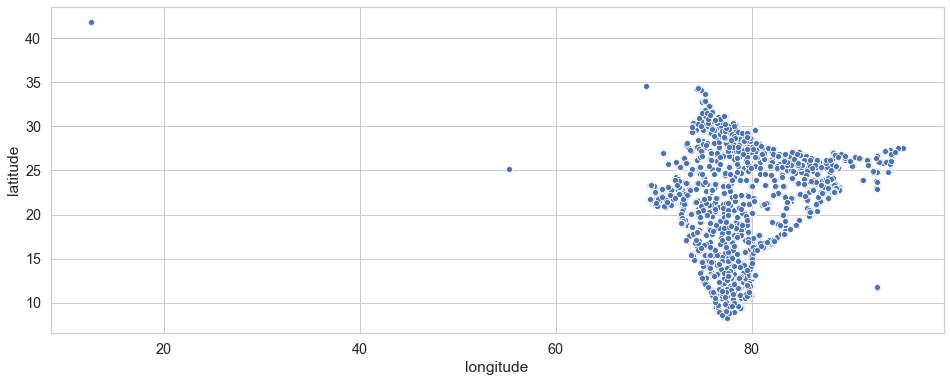

In [43]:
plt.figure(figsize=(16,6))
sns.scatterplot(x="longitude", y="latitude", data = event_data)

In [44]:
event_data.nunique()

event_id     3252950
device_id    60865  
timestamp    588126 
longitude    53890  
latitude     54627  
city         933    
state        32     
dtype: int64

In [45]:
event_data.isnull().sum()

event_id     0  
device_id    453
timestamp    0  
longitude    423
latitude     423
city         0  
state        377
dtype: int64

In [46]:
event_data[event_data.state.isna()].city.value_counts()

Delhi            64
Pune             63
Indore           51
Jaipur           49
Chennai          47
Visakhapatnam    47
Gangarampur      26
Arambagh         16
Channapatna      14
Name: city, dtype: int64

- Data frame has 377 missing values of __state__ out of which 64 is Delhi 
- confirmed from the city data, the missing value of state can be filled with corresponding states of these cities

### Data Preprocessing

In [47]:
miss_data =  {'Delhi' : 'Delhi','Pune' : 'Maharashtra', 'Indore' : 'MadhyaPradesh','Jaipur' : 'Rajasthan',
              'Visakhapatnam' : 'AndhraPradesh', 'Chennai' : 'TamilNadu','Gangarampur' : 'WestBengal',
                'Arambagh' : 'WestBengal','Channapatna' : 'Karnataka'}

In [48]:
event_data.state = event_data.state.fillna(event_data.city.map(miss_data))

In [49]:
event_data.isnull().sum()

event_id     0  
device_id    453
timestamp    0  
longitude    423
latitude     423
city         0  
state        0  
dtype: int64

- After filling missing value for State, as we need to analyse only Delhi region, we can  extract the delhi data and created separate Datframe for further process.

### Delhi State Observations

In [50]:
df_delhi = event_data[event_data.state  ==  'Delhi']

In [51]:
df_delhi.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2973347786994914304.000000,2016-05-07 22:52:05,77.225680,28.730140,Delhi,Delhi
2,605968,-3264499652692492800.000000,2016-05-02 14:23:04,77.256810,28.757910,Delhi,Delhi
8,2309828,3020769016382465536.000000,2016-05-04 09:24:50,77.263920,28.757910,Delhi,Delhi
13,2633127,-3090166955280575488.000000,2016-05-05 04:42:59,77.285920,28.758380,Delhi,Delhi
17,2224400,7566051280927281152.000000,2016-05-01 00:07:47,77.240480,28.715660,Delhi,Delhi


__Data Exploration: Understanding the Delhi Dataset__

In [52]:
df_delhi.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 751797 entries, 0 to 3252947
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   event_id   751797 non-null  int64  
 1   device_id  751728 non-null  float64
 2   timestamp  751797 non-null  object 
 3   longitude  751734 non-null  float64
 4   latitude   751734 non-null  float64
 5   city       751797 non-null  object 
 6   state      751797 non-null  object 
dtypes: float64(3), int64(1), object(3)
memory usage: 45.9+ MB


- Total 751797 observation are present for the Delhi state in the Events Dataset

In [53]:
df_delhi.describe(include='all')

,event_id,device_id,timestamp,longitude,latitude,city,state
count,751797.000000,751728.000000,751797,751734.000000,751734.000000,751797,751797
unique,nan,nan,412099,nan,nan,10,1
top,nan,nan,2016-05-03 19:04:11,nan,nan,Delhi,Delhi
freq,nan,nan,12,nan,nan,744276,751797
mean,1619648.722227,-78757171455162160.000000,NaN,77.264571,28.725058,NaN,NaN
std,943376.464972,5346872724761622528.000000,NaN,0.140281,0.040465,NaN,NaN
min,1.000000,-9222956879900150784.000000,NaN,12.567400,25.204800,NaN,NaN
25%,801489.000000,-4768646315694768128.000000,NaN,77.241960,28.703530,NaN,NaN
50%,1620310.000000,-173653915615733824.000000,NaN,77.265580,28.725730,NaN,NaN
75%,2436282.000000,4681053706637477888.000000,NaN,77.287860,28.747640,NaN,NaN


In [54]:
df_delhi.nunique()

event_id     751797
device_id    4909  
timestamp    412099
longitude    3862  
latitude     3902  
city         10    
state        1     
dtype: int64

In [55]:
df_delhi.isnull().sum()

event_id     0 
device_id    69
timestamp    0 
longitude    63
latitude     63
city         0 
state        0 
dtype: int64

- There sre 69 missing values of event_id & 63 missing values of longitude & latitude each.

#### Missing values Treatment

__device_id:__

- These 69 missing observations of __device_id__ belongs to Delhi state is to be filled with the appropriate value.

In [56]:
df_delhi[df_delhi['device_id'].isna()].latitude.value_counts()

28.728890    23
28.719970    23
28.721050    23
Name: latitude, dtype: int64

In [57]:
df_delhi[df_delhi['device_id'].isna()].longitude.value_counts()

77.292480    23
77.303150    23
77.274810    23
Name: longitude, dtype: int64

- From the above observation we can now see that there are three sets of coordinates has the missing value of __device_id__.

- 69 row with missing value of __device_id__ has thee sets of coordinates (77.292481-28.719966, 77.274814-28.721053, 77.303153-28.728888).

- Hence the missing values of __device_id__ can be replaced with the corresponding __device_id__ values of the above __longitude__ & __latitude__ present in the other rows.

In [58]:
df1 = df_delhi[(df_delhi.longitude == 77.292480) | (df_delhi.longitude == 77.303150) | (df_delhi.longitude == 77.274810)]
df1

,event_id,device_id,timestamp,longitude,latitude,city,state
405,635813,5098778421671837696.000000,2016-05-04 15:01:25,77.292480,28.719970,Delhi,Delhi
1994,923207,-6875585507485886464.000000,2016-05-04 09:02:19,77.303150,28.728890,Delhi,Delhi
3316,1623140,3724654925765158912.000000,2016-05-01 22:17:57,77.274810,28.721050,Delhi,Delhi
3671,238690,3724654925765158912.000000,2016-05-02 23:44:04,77.274810,28.721050,Delhi,Delhi
4634,1758726,3724654925765158912.000000,2016-05-01 22:12:22,77.274810,28.721050,Delhi,Delhi
4825,1707403,-6875585507485886464.000000,2016-05-04 07:49:19,77.303150,28.728890,Delhi,Delhi
5353,2723414,-6875585507485886464.000000,2016-05-02 12:00:48,77.303150,28.728890,Delhi,Delhi
5555,2083247,5098778421671837696.000000,2016-05-04 14:28:56,77.292480,28.719970,Delhi,Delhi
5685,1537184,5098778421671837696.000000,2016-05-03 11:35:12,77.292480,28.719970,Delhi,Delhi
5890,1445736,5098778421671837696.000000,2016-05-02 08:22:37,77.292480,28.719970,Delhi,Delhi


In [59]:
df1.latitude.value_counts()

28.719970    2722
28.721050    2347
28.728890    2310
Name: latitude, dtype: int64

In [60]:
df1.device_id.value_counts()

5098778421671837696.000000     2699
3724654925765158912.000000     2324
-6875585507485886464.000000    2287
Name: device_id, dtype: int64

- missing __device_id__ corresponding to the longitude & latitude present in the other rows are:

In [61]:
miss_device = {77.292480:5098778421671837696.000000,77.303150:-6875585507485886464.000000,77.274810:3724654925765158912.000000}

In [62]:
df_delhi.device_id = df_delhi.device_id.fillna(df_delhi.longitude.map(miss_device))

In [63]:
df_delhi.isnull().sum()

event_id     0 
device_id    0 
timestamp    0 
longitude    63
latitude     63
city         0 
state        0 
dtype: int64

__latitude & longitude:__

In [64]:
df_delhi[df_delhi['latitude'].isna()].device_id.value_counts()

5375599021847303168.000000    21
1779631023439405312.000000    21
4782582047729166336.000000    21
Name: device_id, dtype: int64

In [65]:
df_delhi[df_delhi['longitude'].isna()].device_id.value_counts()

5375599021847303168.000000    21
1779631023439405312.000000    21
4782582047729166336.000000    21
Name: device_id, dtype: int64

- From the above observation we can now see that there are three sets of device_id values has the missing value of latitude & longitude.
- from the above two set of samples we can infer that the each __device_id__ has a unique location coordinates.

- From the above observation we can now replace the missing value of __latitude__ with the corresponding values of the above __device_id__.

In [66]:
df2 = df_delhi[(df_delhi.device_id == 5375599021847303168.000000) | (df_delhi.device_id == 1779631023439405312.000000) | (df_delhi.device_id == 4782582047729166336.000000)]
df2

,event_id,device_id,timestamp,longitude,latitude,city,state
1001,2946474,1779631023439405312.000000,2016-05-06 14:01:59,77.235420,28.738900,Delhi,Delhi
1042,727041,1779631023439405312.000000,2016-05-05 07:04:00,77.235420,28.738900,Delhi,Delhi
1048,3106,5375599021847303168.000000,2016-05-02 05:27:38,77.283450,28.718390,Delhi,Delhi
1094,3221013,4782582047729166336.000000,2016-05-03 01:50:15,77.225220,28.718380,Delhi,Delhi
1470,1693934,1779631023439405312.000000,2016-05-05 18:47:16,77.235420,28.738900,Delhi,Delhi
1558,2143455,5375599021847303168.000000,2016-05-07 06:39:29,77.283450,28.718390,Delhi,Delhi
1688,2295595,5375599021847303168.000000,2016-05-07 18:04:18,77.283450,28.718390,Delhi,Delhi
1717,897208,5375599021847303168.000000,2016-05-04 09:45:04,77.283450,28.718390,Delhi,Delhi
2209,2799291,1779631023439405312.000000,2016-05-02 09:23:35,77.235420,28.738900,Delhi,Delhi
2623,2241546,5375599021847303168.000000,2016-05-02 16:45:08,77.283450,28.718390,Delhi,Delhi


In [67]:
df2.device_id.value_counts()

5375599021847303168.000000    3128
4782582047729166336.000000    2899
1779631023439405312.000000    2757
Name: device_id, dtype: int64

In [68]:
df2.latitude.value_counts()

28.718390    3107
28.718380    2878
28.738900    2736
Name: latitude, dtype: int64

In [69]:
df2.longitude.value_counts()

77.283450    3107
77.225220    2878
77.235420    2736
Name: longitude, dtype: int64

- hence the missing values of latitude & longitude in the rows with these __device_id__ can be replaced with the corresponding values of the latitude & longitude,

| device_id:                  | longitudes , latidude   |
| --------------------------- |:-----------------------:| 
| 5375599021847303168.000000: | (77.283450 , 28.718390) |
| 1779631023439405312.000000: | (77.235420 , 28.738900) |
| 4782582047729166336.000000: | (77.225220 , 28.718380) |

In [70]:
miss_lat = {5375599021847303168.000000:28.718390,1779631023439405312.000000:28.738900,4782582047729166336.000000:28.718380}

In [71]:
miss_long = {5375599021847303168.000000:77.283450,1779631023439405312.000000:77.235420,4782582047729166336.000000:77.225220}

In [72]:
df_delhi.latitude = df_delhi.latitude.fillna(df_delhi.device_id.map(miss_lat))

In [73]:
df_delhi.longitude = df_delhi.longitude.fillna(df_delhi.device_id.map(miss_long))

In [74]:
df_delhi.isnull().sum()

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

#### Post Profiling: cleaned data for merge

In [75]:
df_delhi.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2973347786994914304.000000,2016-05-07 22:52:05,77.225680,28.730140,Delhi,Delhi
2,605968,-3264499652692492800.000000,2016-05-02 14:23:04,77.256810,28.757910,Delhi,Delhi
8,2309828,3020769016382465536.000000,2016-05-04 09:24:50,77.263920,28.757910,Delhi,Delhi
13,2633127,-3090166955280575488.000000,2016-05-05 04:42:59,77.285920,28.758380,Delhi,Delhi
17,2224400,7566051280927281152.000000,2016-05-01 00:07:47,77.240480,28.715660,Delhi,Delhi


In [76]:
df_delhi.shape

(751797, 7)

In [77]:
df_delhi.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 751797 entries, 0 to 3252947
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   event_id   751797 non-null  int64  
 1   device_id  751797 non-null  float64
 2   timestamp  751797 non-null  object 
 3   longitude  751797 non-null  float64
 4   latitude   751797 non-null  float64
 5   city       751797 non-null  object 
 6   state      751797 non-null  object 
dtypes: float64(3), int64(1), object(3)
memory usage: 45.9+ MB


In [78]:
df_delhi.nunique()

event_id     751797
device_id    4909  
timestamp    412099
longitude    3862  
latitude     3902  
city         10    
state        1     
dtype: int64

In [80]:
common1 = np.intersect1d(df_merge.device_id,df_delhi.device_id)
common1.shape

(4909,)

## Final Merged total Datasets

In [81]:
final_merge = pd.merge(left=df_delhi,right=df_merge, how='inner',on='device_id')
final_merge.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,gender,age,group,phone_brand,device_model
0,2765368,2973347786994914304.000000,2016-05-07 22:52:05,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,优米,UIMI3
1,1355198,2973347786994914304.000000,2016-05-01 01:35:45,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,优米,UIMI3
2,1630972,2973347786994914304.000000,2016-05-03 00:07:34,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,优米,UIMI3
3,2732453,2973347786994914304.000000,2016-05-01 06:15:59,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,优米,UIMI3
4,1562542,2973347786994914304.000000,2016-05-01 20:34:19,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,优米,UIMI3


### Data Exploration: Understanding the Total merged (final_merge) Dataset

In [82]:
final_merge.shape

(751797, 12)

In [83]:
final_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 751797 entries, 0 to 751796
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   event_id      751797 non-null  int64  
 1   device_id     751797 non-null  float64
 2   timestamp     751797 non-null  object 
 3   longitude     751797 non-null  float64
 4   latitude      751797 non-null  float64
 5   city          751797 non-null  object 
 6   state         751797 non-null  object 
 7   gender        751797 non-null  object 
 8   age           751797 non-null  int64  
 9   group         751797 non-null  object 
 10  phone_brand   751797 non-null  object 
 11  device_model  751797 non-null  object 
dtypes: float64(3), int64(2), object(7)
memory usage: 74.6+ MB


In [84]:
final_merge.describe(include='all')

,event_id,device_id,timestamp,longitude,latitude,city,state,gender,age,group,phone_brand,device_model
count,751797.000000,751797.000000,751797,751797.000000,751797.000000,751797,751797,751797,751797.000000,751797,751797,751797
unique,nan,nan,412099,nan,nan,10,1,2,nan,12,61,632
top,nan,nan,2016-05-03 19:04:11,nan,nan,Delhi,Delhi,M,nan,M39+,华为,红米note
freq,nan,nan,12,nan,nan,744276,751797,546469,nan,143781,199947,28625
mean,1619648.722227,-78690351894583408.000000,NaN,77.264569,28.725058,NaN,NaN,NaN,34.067341,NaN,NaN,NaN
std,943376.464972,5346877595114955776.000000,NaN,0.140275,0.040463,NaN,NaN,NaN,9.807694,NaN,NaN,NaN
min,1.000000,-9222956879900150784.000000,NaN,12.567400,25.204800,NaN,NaN,NaN,16.000000,NaN,NaN,NaN
25%,801489.000000,-4768646315694768128.000000,NaN,77.241960,28.703530,NaN,NaN,NaN,27.000000,NaN,NaN,NaN
50%,1620310.000000,-173653915615733824.000000,NaN,77.265580,28.725730,NaN,NaN,NaN,32.000000,NaN,NaN,NaN
75%,2436282.000000,4681053706637477888.000000,NaN,77.287860,28.747630,NaN,NaN,NaN,40.000000,NaN,NaN,NaN


Minimum age of the user - 16 years

Maximum age of the user - 94 years

In [85]:
final_merge.nunique()

event_id        751797
device_id       4909  
timestamp       412099
longitude       3862  
latitude        3902  
city            10    
state           1     
gender          2     
age             69    
group           12    
phone_brand     61    
device_model    632   
dtype: int64

In [86]:
final_merge.isnull().sum()

event_id        0
device_id       0
timestamp       0
longitude       0
latitude        0
city            0
state           0
gender          0
age             0
group           0
phone_brand     0
device_model    0
dtype: int64

In [87]:
final_merge.timestamp.max()

'2016-05-08 00:00:08'

In [88]:
final_merge.timestamp.min()

'2016-04-30 23:52:26'

- Data captured from 2016-04-30 23:52:26 to 2016-05-08 00:00:08

In [87]:
final_merge.phone_brand.value_counts().reset_index()

,index,phone_brand
0,华为,199947
1,小米,172988
2,三星,122891
3,vivo,65968
4,OPPO,48360
5,魅族,44398
6,酷派,32962
7,乐视,14202
8,HTC,9943
9,联想,7593


In [88]:
final_merge.device_model.value_counts().reset_index()

,index,device_model
0,红米note,28625
1,荣耀6,28274
2,荣耀畅玩4X,25158
3,Mate 7,20719
4,MI 4,18754
5,MI 3,15400
6,Galaxy Note 3,15063
7,荣耀6 Plus,14305
8,MI 2S,13905
9,荣耀3X畅玩版,11317


### Post Processing

#### Translate Phone Brand & Phone device from Chinese to English

In [89]:
brand = {'华为' : 'Huawei', '小米' :  'Xiǎomǐ', '三星' : 'Samsung', '魅族' : 'Meizu', '酷派' : 'Coolpad', '乐视' : 'LeTV',
         '联想 ':'Lenovo','努比亚' : 'Nubia', '华硕' : 'Asus', '优米' : 'youmi', '锤子' : 'hammer', '一加' : 'OnePlus',
         '中国移动' : 'China Mobile', '美图' : 'Mito', '海信' : 'Hisense', '语信' : 'Yu xin', '贝尔丰' : 'Belfon', 
         '奇酷' : 'Qiku', '朵唯' : 'Dove', '百立丰' : 'Bai li feng','天语' : 'Amagatarai','纽曼':'Newman','爱派尔':'Apple',
         '唯米':'Wei Mi','青橙':'Green Orange','富可视':'InFocus','白米':'Baimi','维图': 'Vitu', '小杨树':'Little poplar',
         '艾优尼':'Ayuni','百加':'Bajia','黑米':'Hei mi','摩托罗拉':'Motorola','康佳':'Konka','诺基亚':'Nokia','波导':'Bodao',
         '广信': 'Guang xin','易派': 'Yipai','酷比':'Coolby','青葱':'Qing Cong','欧比':'Obi','大可乐':'Dakele','唯比':'Weibi',
         '优购':'Yougo','米歌' : 'Mi Ge','至尊宝':'Zhizun bao','酷比魔方':"Rubik's Cube",'基伍':'Kivu','亿通':'Toru',
         '欧沃':'Ovo','邦华':'Banghua','欧博信':'Obersion','台电':'Taipower','德赛':'Desai'}

In [90]:
final_merge['phone_brand'].replace(brand,inplace=True)

In [91]:
final_merge.phone_brand.value_counts().reset_index()

,index,phone_brand
0,Huawei,199947
1,Xiǎomǐ,172988
2,Samsung,122891
3,vivo,65968
4,OPPO,48360
5,Meizu,44398
6,Coolpad,32962
7,LeTV,14202
8,HTC,9943
9,Lenovo,7593


In [92]:
model = {'红米note':'Redmi note','荣耀6':'Glory 6','荣耀畅玩4X':'Honor Play 4X','荣耀6 Plus':'Honor 6 Plus',
         '荣耀3X畅玩版':'Honor 3X Play Edition','魅蓝Note 2':'Charm Blue Note 2','荣耀3C':'Honor 3C',
         '荣耀畅玩4C':'Honor Play 4C','红米1S':'Redmi 1S','红米':'Hong Mi','荣耀7':'Glory 7','红米Note2':'Redmi Note2',
         '荣耀畅玩5X':'Honor Play 5X','魅蓝NOTE':'Charm Blue NOTE','超级手机1s':'Super phone 1s','红米2':'Redmi 2',
         '小米note':'Xiaomi note','小米4C':'Mi 4C','红米Note3':'Redmi Note3','红米note增强版':'Redmi Note Enhanced Edition',
         '超级手机1':'Super phone 1','红米2A':'Redmi 2A','大神Note3':'Okami Note3','大神F1':'Okami F1','魅蓝2':'Charm Blue 2',
         '畅享5':'Enjoy 5','小星星':'little stars','note顶配版':'note top version','超级手机1 Pro':'Super Phone 1 Pro',
          '荣耀7i':'Honor 7i','荣耀畅玩4':'Honor Play 4','ivvi 小骨Pro':'ivvi small bone Pro','荣耀3X':'Honor 3X',
          '畅享5S':'Enjoy 5S','荣耀畅玩5':'Honor Play 5','荣耀3C畅玩版':'Honor 3C Play Edition','大神F2':'Ogami F2',
          '2016版 Galaxy A7':'2016 version of Galaxy A7','乐檬K3':'Lemon K3','荣耀4A':'Honor 4A','坚果手机':'Nut Mobile',
          '联想黄金斗士S8':'Lenovo Gold Fighter S8','魅蓝':'Charm Blue','锋尚Pro':'Fengshang Pro',
         '超级手机Max':'Super phone Max','魅蓝metal':'Charm blue metal','星星1号':'Star 1','麦芒3':'Maimang 3',
          '黄金斗士A8':'Golden Fighter A8','乐檬K3 Note':'Le Meng K3 Note','荣耀X2':'Honor X2',
         '大神F2全高清版':'Great God F2 Full HD Version','麦芒4':'Maimang 4','大神F1Plus':'Okami F1 Plus',
         '荣耀畅玩4C运动版':'Honor Play 4C Sports Edition','大神Note':'Okami Note','大神X7':'Ogami X7',
         '荣耀6 plus':'Honor 6 plus','青春版':'Youth Edition','纽扣':'Buttons','红辣椒':'Red chili','红牛V5':'Red Bull V5',
         '红辣椒Note':'Red Pepper Note','大观4':'Grand View 4','天鉴W900':'Tianjian W900','红米3':'Redmi 3',
         '锋尚':'Feng Shang','么么哒3N':'Moda 3N','青漾3':'Qingyang 3','大神1s':'Okami 1s','旗舰版':'Ultimate Edition',
        '黄金斗士Note8':'Golden Fighter Note8','小辣椒 6':'Chili 6','Mate 7 青春版':'Mate 7 Youth Edition',
         '么么哒':'muah','荣耀畅玩平板T1':'Honor Play Tablet T1','锋尚2':'Feng Shang 2','小鲜3':'Xiaoxian 3',
        'metal 标准版':'metal standard edition','三星big foot':'Samsung big foot','荣耀平板T1-823L':'Honor Tablet T1-823L',
        '春雷HD':'Chunlei HD','红辣椒Note3':'Red Pepper Note3','My 布拉格':'My Prague','锋尚Max':'Fengshang Max',
        '黄金斗士S8畅玩版':'Golden Fighter S8 Play Edition','麦芒3S':'Maimang 3S','荣耀+':'Glory+','乐玩':'Fun',
        '魔镜 X5':'Magic Mirror X5','Xperia Z1 炫彩版':'Xperia Z1 Colorful Edition'}

In [93]:
final_merge['device_model'].replace(model,inplace=True)

In [94]:
final_merge.device_model.value_counts().reset_index()

,index,device_model
0,Redmi note,28625
1,Glory 6,28274
2,Honor Play 4X,25158
3,Mate 7,20719
4,MI 4,18754
5,MI 3,15400
6,Galaxy Note 3,15063
7,Honor 6 Plus,14305
8,MI 2S,13905
9,Honor 3X Play Edition,11317


In [95]:
final_merge.sample(10)

,event_id,device_id,timestamp,longitude,latitude,city,state,gender,age,group,phone_brand,device_model
221005,2235850,-8167786998992613376.000000,2016-05-03 12:08:40,77.285240,28.683190,Delhi,Delhi,F,28,F27-28,Xiǎomǐ,MI 3
291961,1950529,-1989271636660652544.000000,2016-05-03 23:01:35,77.306450,28.686150,Delhi,Delhi,M,44,M39+,Coolpad,Okami F1
7977,357490,-3746248670824158208.000000,2016-05-04 18:51:37,77.264730,28.756090,Delhi,Delhi,M,46,M39+,vivo,X5M
646637,2507583,-867408276293051008.000000,2016-05-04 07:16:50,77.254630,28.759220,Delhi,Delhi,F,32,F29-32,OPPO,R823T
219577,794016,-1615768235913047808.000000,2016-05-01 14:07:20,77.290750,28.751770,Delhi,Delhi,M,45,M39+,Huawei,Mate 7
639485,2175975,-2647561200890197504.000000,2016-05-05 06:15:51,77.269460,28.723490,Delhi,Delhi,M,28,M27-28,OPPO,6607
73033,2755126,-2982766727048699904.000000,2016-05-01 16:24:01,77.301960,28.698100,Delhi,Delhi,M,25,M23-26,Huawei,Glory 6
653567,847459,-8545184470818576384.000000,2016-05-05 13:16:44,77.280260,28.720360,Delhi,Delhi,M,40,M39+,Xiǎomǐ,Hong Mi
49416,2715179,-6242501228649113600.000000,2016-05-02 05:21:15,77.293990,28.749820,Delhi,Delhi,M,20,M22-,Xiǎomǐ,ELIFE E3T
345483,247895,8307497511776433152.000000,2016-05-07 09:40:21,77.263630,28.686790,Delhi,Delhi,M,39,M39+,Xiǎomǐ,MI 4


In [96]:
final_merge.nunique()

event_id        751797
device_id       4909  
timestamp       412099
longitude       3862  
latitude        3902  
city            10    
state           1     
gender          2     
age             69    
group           12    
phone_brand     61    
device_model    632   
dtype: int64

In [97]:
final_merge['timestamp'] = pd.to_datetime(final_merge['timestamp'], format='%Y-%m-%d %H:%M:%S')

In [98]:
final_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 751797 entries, 0 to 751796
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   event_id      751797 non-null  int64         
 1   device_id     751797 non-null  float64       
 2   timestamp     751797 non-null  datetime64[ns]
 3   longitude     751797 non-null  float64       
 4   latitude      751797 non-null  float64       
 5   city          751797 non-null  object        
 6   state         751797 non-null  object        
 7   gender        751797 non-null  object        
 8   age           751797 non-null  int64         
 9   group         751797 non-null  object        
 10  phone_brand   751797 non-null  object        
 11  device_model  751797 non-null  object        
dtypes: datetime64[ns](1), float64(3), int64(2), object(6)
memory usage: 74.6+ MB


### Outliers in Logitude & Latitude

In [99]:
import geopandas as gpd
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

import tqdm
from tqdm._tqdm_notebook import tqdm_notebook

import plotly_express as px

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

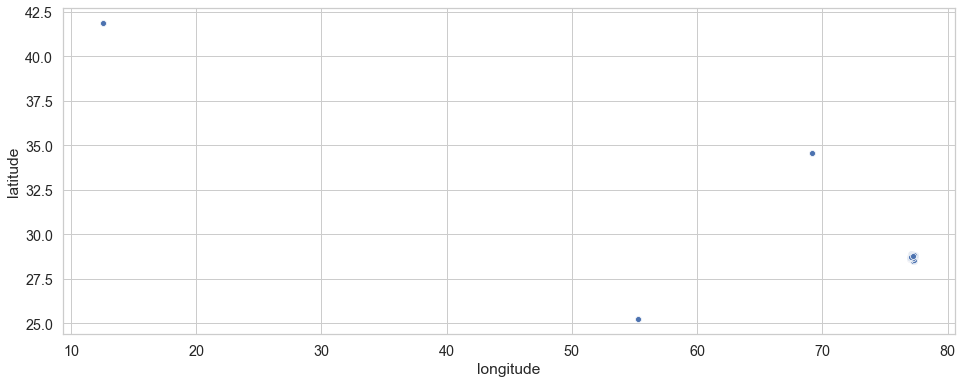

In [100]:
plt.figure(figsize=(16,6))
sns.scatterplot(x="longitude", y="latitude", data = final_merge)

In [101]:
df_lat = final_merge[(final_merge['latitude']>30) | (final_merge['latitude']<27.5)]
df_lat.head(10)

,event_id,device_id,timestamp,longitude,latitude,city,state,gender,age,group,phone_brand,device_model
11414,441997,2334568628287627776.000000,2016-05-05 10:58:04,55.270800,25.204800,Delhi,Delhi,M,39,M39+,Asus,ZenFone 2
11831,284181,2334568628287627776.000000,2016-05-03 19:35:03,55.270800,25.204800,Delhi,Delhi,M,39,M39+,Asus,ZenFone 2
11994,420678,2334568628287627776.000000,2016-05-06 17:17:59,55.270800,25.204800,Delhi,Delhi,M,39,M39+,Asus,ZenFone 2
62831,251785,1057289835566390656.000000,2016-05-07 14:23:56,69.207500,34.555300,Delhi,Delhi,M,31,M29-31,LeTV,Super Phone 1 Pro
63239,409004,1057289835566390656.000000,2016-05-06 12:28:27,69.207500,34.555300,Delhi,Delhi,M,31,M29-31,LeTV,Super Phone 1 Pro
63253,378539,1057289835566390656.000000,2016-05-01 17:30:29,69.207500,34.555300,Delhi,Delhi,M,31,M29-31,LeTV,Super Phone 1 Pro
128716,452839,-1448078833416777984.000000,2016-05-01 16:44:00,12.567400,41.871900,Delhi,Delhi,M,34,M32-38,Huawei,Ascend G6
129118,419288,-1448078833416777984.000000,2016-05-04 09:06:44,12.567400,41.871900,Delhi,Delhi,M,34,M32-38,Huawei,Ascend G6
129588,282400,-1448078833416777984.000000,2016-05-05 17:33:57,12.567400,41.871900,Delhi,Delhi,M,34,M32-38,Huawei,Ascend G6


In [102]:
gdf_delhi = gpd.GeoDataFrame(final_merge, geometry=gpd.points_from_xy(final_merge.longitude,final_merge.latitude))
gdf_delhi.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,gender,age,group,phone_brand,device_model,geometry
0,2765368,2973347786994914304.000000,2016-05-07 22:52:05,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,youmi,UIMI3,POINT (77.22568 28.73014)
1,1355198,2973347786994914304.000000,2016-05-01 01:35:45,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,youmi,UIMI3,POINT (77.22568 28.73014)
2,1630972,2973347786994914304.000000,2016-05-03 00:07:34,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,youmi,UIMI3,POINT (77.22568 28.73014)
3,2732453,2973347786994914304.000000,2016-05-01 06:15:59,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,youmi,UIMI3,POINT (77.22568 28.73014)
4,1562542,2973347786994914304.000000,2016-05-01 20:34:19,77.225680,28.730140,Delhi,Delhi,M,35,M32-38,youmi,UIMI3,POINT (77.22568 28.73014)


In [103]:
import folium
from folium.plugins import MarkerCluster
from collections import Counter

In [104]:
city_map = folium.Map(location=[28.725058, 77.22568],zoom_start=11)

In [106]:
df2 = gdf_delhi[['latitude','longitude','city','state']]
df2 = df2.drop_duplicates(keep='first',).reset_index()

In [107]:
for lat,long,city,state in zip(df2['latitude'],df2['longitude'],df2['city'],df2['state']):
    folium.CircleMarker(location=[lat,long],fill_opacity=0.7,fill=True,key_on =state,color='red', \
                        radius=2,weight=0).add_to(city_map)

In [108]:
city_map.save("city_wise_map_plot.html")
city_map

from the above observations we can infer that these 9 observations are registered outside india but belongs to Delhi, might be they were in roaming.

In [109]:
geolocator = Nominatim(user_agent="location-finder" )

In [110]:
df_lat["address"] = df_lat.apply(lambda x:geolocator.reverse(str(x["latitude"])+","+str(x["longitude"])).address.split(","), 
                                                             axis=1)

In [111]:
df_lat.head(10)

,event_id,device_id,timestamp,longitude,latitude,city,state,gender,age,group,phone_brand,device_model,address
11414,441997,2334568628287627776.000000,2016-05-05 10:58:04,55.270800,25.204800,Delhi,Delhi,M,39,M39+,Asus,ZenFone 2,"[Toyota building, شارع المركز المالي, الوصل, دبي, P. O. BOX 31166, الإمارات العربية المتحدة]"
11831,284181,2334568628287627776.000000,2016-05-03 19:35:03,55.270800,25.204800,Delhi,Delhi,M,39,M39+,Asus,ZenFone 2,"[Toyota building, شارع المركز المالي, الوصل, دبي, P. O. BOX 31166, الإمارات العربية المتحدة]"
11994,420678,2334568628287627776.000000,2016-05-06 17:17:59,55.270800,25.204800,Delhi,Delhi,M,39,M39+,Asus,ZenFone 2,"[Toyota building, شارع المركز المالي, الوصل, دبي, P. O. BOX 31166, الإمارات العربية المتحدة]"
62831,251785,1057289835566390656.000000,2016-05-07 14:23:56,69.207500,34.555300,Delhi,Delhi,M,31,M29-31,LeTV,Super Phone 1 Pro,"[کابل, کابل ولسوالۍ, ولایت كابل, افغانستان]"
63239,409004,1057289835566390656.000000,2016-05-06 12:28:27,69.207500,34.555300,Delhi,Delhi,M,31,M29-31,LeTV,Super Phone 1 Pro,"[کابل, کابل ولسوالۍ, ولایت كابل, افغانستان]"
63253,378539,1057289835566390656.000000,2016-05-01 17:30:29,69.207500,34.555300,Delhi,Delhi,M,31,M29-31,LeTV,Super Phone 1 Pro,"[کابل, کابل ولسوالۍ, ولایت كابل, افغانستان]"
128716,452839,-1448078833416777984.000000,2016-05-01 16:44:00,12.567400,41.871900,Delhi,Delhi,M,34,M32-38,Huawei,Ascend G6,"[Viale Palmiro Togliatti, Torrespaccata 8a, Quartiere XXIV Don Bosco, Roma, Roma Capitale, Lazio, 00172, Italia]"
129118,419288,-1448078833416777984.000000,2016-05-04 09:06:44,12.567400,41.871900,Delhi,Delhi,M,34,M32-38,Huawei,Ascend G6,"[Viale Palmiro Togliatti, Torrespaccata 8a, Quartiere XXIV Don Bosco, Roma, Roma Capitale, Lazio, 00172, Italia]"
129588,282400,-1448078833416777984.000000,2016-05-05 17:33:57,12.567400,41.871900,Delhi,Delhi,M,34,M32-38,Huawei,Ascend G6,"[Viale Palmiro Togliatti, Torrespaccata 8a, Quartiere XXIV Don Bosco, Roma, Roma Capitale, Lazio, 00172, Italia]"


- Out of these 9 observations 

3 observations are from Kabul-Afghanistan,
3 observations are from Dubai-UAE and
3 observations are from Rome-Italy

Since these 9 observations are registered in delhi city, we can replace the Longitude & Latitude values with the Mode value of Delhi city Observations.

In [112]:
df_lat.latitude.value_counts()

41.871900    3
34.555300    3
25.204800    3
Name: latitude, dtype: int64

In [113]:
df_lat.longitude.value_counts()

55.270800    3
12.567400    3
69.207500    3
Name: longitude, dtype: int64

In [114]:
df1 = final_merge[final_merge.city == 'Delhi']

In [115]:
df1.latitude.mode()

0   28.688980
dtype: float64

In [116]:
df1.longitude.mode()

0   77.293990
dtype: float64

In [117]:
final_merge['latitude'] = final_merge['latitude'].replace([41.871900,34.555300,25.204800],28.688980)

In [118]:
final_merge['longitude'] = final_merge['longitude'].replace([55.270800,12.567400,69.207500],77.293990)

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

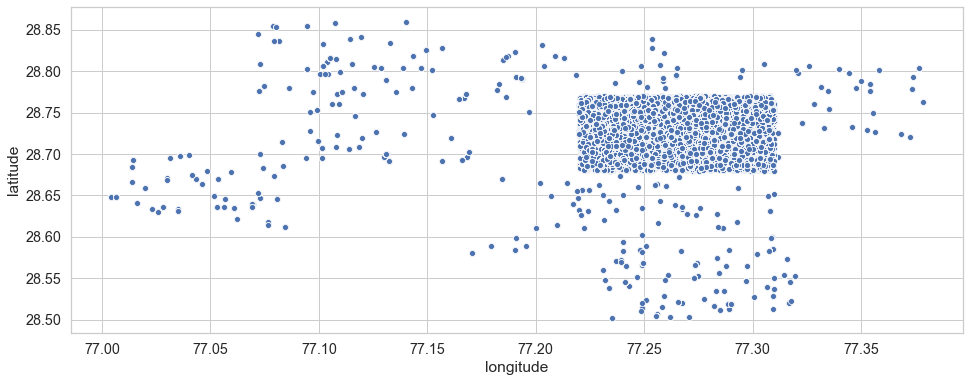

In [119]:
plt.figure(figsize=(16,6))
sns.scatterplot(x="longitude", y="latitude", data = final_merge)

In [120]:
final_merge = final_merge.drop('geometry',1)

In [121]:
final_merge.shape

(751797, 12)

In [122]:
final_merge.to_csv('events_data_delhi.csv',index=False)

In [90]:
common2 = np.intersect1d(df_delhi.device_id,(np.intersect1d(user_data.device_id, device_data.device_id)))
common2.shape

(4909,)